## Macro Asset Rotation

This dataset is perhaps better viewed through a dashboard, please use your login details to acces sit here.

In [1]:
%load_ext autoreload
%autoreload 2

**All Risks**

In [1]:
import sovai as sov
sov.basic_auth("your_email@example.com", "your_password")

True

In [2]:
df_past = sov.data("allocation/past"); df_past.tail(10)

AttributeError: 'NoneType' object has no attribute 'tail'

In [14]:
df_future = sov.data("allocation/future"); df_future.head(10)

,bonds,equities,commodities,dollar,real_estate
date,,,,,
2024-04-30,0.375,0.259,0.084,0.203,0.079
2024-05-31,0.369,0.272,0.088,0.183,0.088
2024-06-30,0.346,0.275,0.096,0.178,0.104
2024-07-31,0.337,0.263,0.107,0.174,0.120
2024-08-31,0.323,0.248,0.118,0.174,0.136
2024-09-30,0.318,0.240,0.127,0.166,0.149
2024-10-31,0.324,0.229,0.132,0.160,0.155
2024-11-30,0.334,0.224,0.136,0.158,0.150
2024-12-31,0.342,0.222,0.137,0.157,0.141


In [7]:
df_allocation = sov.data("allocation/all"); df_allocation.tail(10)

a list is returned


,bonds,equities,commodities,dollar,real_estate
date,,,,,
2031-06-30,0.235,0.210,0.175,0.198,0.182
2031-07-31,0.223,0.203,0.180,0.190,0.204
2031-08-31,0.211,0.195,0.186,0.181,0.227
2031-09-30,0.200,0.184,0.193,0.178,0.244
2031-10-31,0.195,0.182,0.206,0.178,0.239
2031-11-30,0.197,0.182,0.210,0.180,0.231
2031-12-31,0.195,0.182,0.222,0.181,0.220
2032-01-31,0.194,0.188,0.224,0.188,0.206
2032-02-29,0.200,0.195,0.221,0.193,0.192


In [3]:
df_returns = sov.data("allocation/returns"); df_returns.tail(10)

a list is returned


,bonds,equities,commodities,dollar,real_estate
date,,,,,
2031-06-30,0.280,0.154,-0.326,-0.027,0.528
2031-07-31,-0.069,-0.107,0.751,-0.547,0.027
2031-08-31,-0.253,-0.371,-0.004,-0.053,-0.334
2031-09-30,0.050,-0.255,-0.163,0.179,-0.472
2031-10-31,-0.173,0.253,0.034,-0.121,-0.911
2031-11-30,0.044,-0.363,-0.428,-0.048,0.310
2031-12-31,-0.365,-0.072,0.227,-0.268,-0.112
2032-01-31,-0.357,0.287,-0.039,0.017,-0.863
2032-02-29,0.766,0.119,-0.118,0.180,-0.453


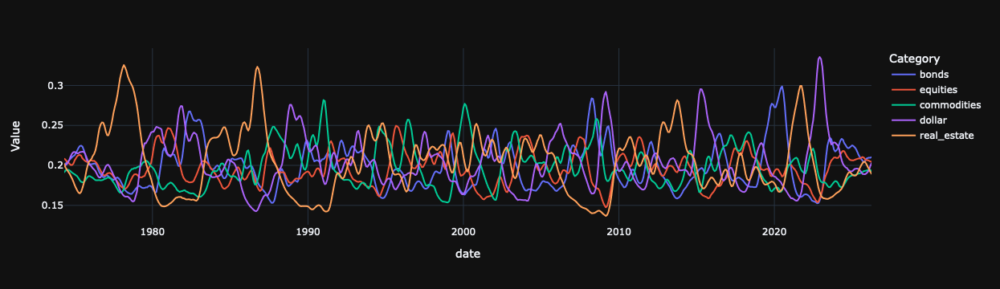

In [18]:
from scipy.special import softmax
import pandas as pd

preds = df_returns.copy()
df_allocation = pd.DataFrame(softmax(preds.values,axis=1))
df_allocation.columns = preds.columns
df_allocation.index = preds.index
df_allocation = df_allocation.ewm(6).mean().rolling(6).mean()
df_allocation_new = pd.DataFrame(softmax(df_allocation.values*2,axis=1))
df_allocation_new.columns = df_allocation.columns
df_allocation_new.index = df_allocation.index
df_allocation_new = df_allocation_new.dropna()
df_allocation_new.index.name = "date"

import pandas as pd
from datetime import datetime, timedelta
import plotly.express as px


# Current date
today = datetime.now()

# Calculate start and end dates for the filter
# start_date = today.replace(year=today.year, month=today.month - 1, day=1)
end_date = today.replace(year=today.year + 2, month=today.month, day=1) - timedelta(days=1)

start_date = today.replace(year=today.year - 50, month=today.month, day=1) - timedelta(days=1)


df_melt = df_allocation_new.reset_index().melt(id_vars='date', var_name='Category', value_name='Value')

# Filter the DataFrame
filtered_df = df_melt[(df_melt['date'] >= start_date) & (df_melt['date'] <= end_date)]
# Create a stacked area chart using plotly express

fig = px.line(filtered_df, x='date', y='Value', color='Category')

fig.show()

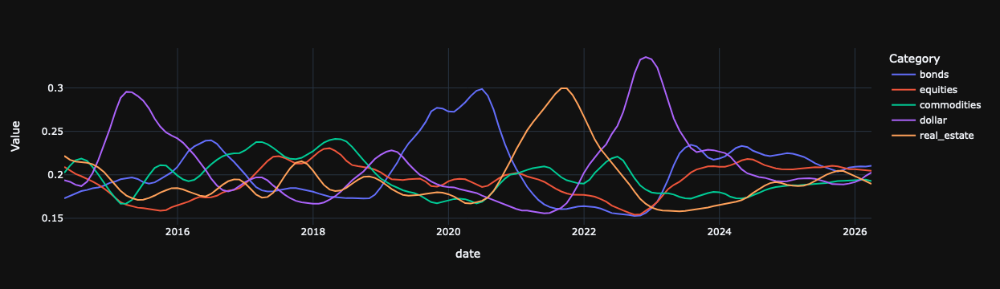

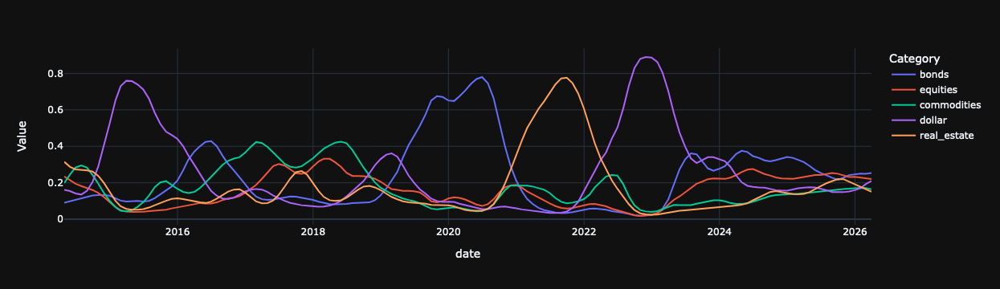

In [12]:
import pandas as pd
from datetime import datetime, timedelta
import plotly.express as px


# Current date
today = datetime.now()

# Calculate start and end dates for the filter
# start_date = today.replace(year=today.year, month=today.month - 1, day=1)
end_date = today.replace(year=today.year + 2, month=today.month, day=1) - timedelta(days=1)

start_date = today.replace(year=today.year - 10, month=today.month, day=1) - timedelta(days=1)



df_melt = df_allocation.reset_index().melt(id_vars='date', var_name='Category', value_name='Value')

# Filter the DataFrame
filtered_df = df_melt[(df_melt['date'] >= start_date) & (df_melt['date'] <= end_date)]
# Create a stacked area chart using plotly express

fig = px.line(filtered_df, x='date', y='Value', color='Category')

fig.show()

In [9]:
df_risks = sov.data("risks"); df_risks.tail()

,VIX,HS,MA,EWMA,GARCH,ENSEMBLE,RECESSION_6,RECESSION_12,RECESSION_24,TURBULENCE,SYSTEMIC,CAPE,MARKET_RISK,SP500,ADS_BUSINESS_NEG,CREDIT_SPREAD,TERM_SPREAD,NEWS_SENT_NEG,CORP_BOND_DISTRESS,NAIIM_NEG,AAII_NEG,ATLANTA_UNC,CFSEC_NEG,CFNAI_FNEG,BUILDING_INDEX_NEG,CONSUMER_INDEX_NEG,INDUSTRY_INDEX_NEG,MAIN_INDEX_NEG,RETAIL_INDEX_NEG,SERVICES_INDEX_NEG,MAN_PHIL_NEG,MICS_ICS_NEG,MICS_ICC_NEG,MICS_ICE_NEG,NEW_TRUCKS,NEW_HOMES,MISERY_INDEX,HOUSING_AFFORD_NEG,NONMAN_OUTLOOK_NEG,MAN_NY_NEG,MAN_TEX_NEG,ZEW_SENT_NEG,ZEW_ACTUAL_NEG,BUSINESS_RISK,US_POLICY_UNC_D,UK_POLICY_UNC_D,CHINA_POLICY_UNC_M,US_MARKET_UNC_D,US_POLICY_VOL_M,GLOBAL_POLICY_UNC_M,US_SOVEREIGN_UNC_M,GEO_UNC_D,GEO_UNC_M,GEO_EQUAL_M,WEB_SEARCH_UNC_M,THINKTANK_UNC_M,POLITICAL_RISK,TURING_RISK
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2024-03-24,14.572,21.056,22.079,21.796,11.908,17.594,26.166,52.160,71.320,10.326,28.453,43.247,28.390,40.175,28.481,11.870,28.642,32.678,21.489,18.943,35.475,26.535,40.310,29.068,26.960,40.033,37.618,29.713,26.282,27.815,41.196,47.088,54.929,39.293,61.281,48.224,22.163,77.305,38.217,43.923,41.060,30.045,77.550,37.386,15.453,12.118,28.739,9.827,19.607,49.504,21.990,14.395,21.356,29.845,48.192,20.899,18.210,30.461
2024-03-25,14.572,21.056,22.075,21.791,12.365,17.810,26.166,52.160,71.321,10.290,28.386,43.246,28.436,40.106,28.481,11.937,29.008,32.678,21.491,18.943,35.476,26.535,40.310,29.068,26.960,40.031,37.618,29.714,26.282,27.815,41.196,47.088,54.930,39.293,61.280,48.224,22.160,77.306,38.217,43.922,41.060,30.044,77.551,37.401,14.137,13.388,28.739,9.372,19.607,49.504,21.989,22.014,21.356,29.845,48.192,20.899,18.229,30.491
2024-03-26,14.572,21.055,22.023,21.734,11.615,17.243,26.167,52.161,71.321,10.196,28.251,43.244,28.298,40.041,28.481,12.096,28.551,32.678,21.492,18.943,35.476,26.534,40.310,29.068,26.961,40.029,37.618,29.714,26.282,27.814,41.195,47.088,54.930,39.292,61.280,48.224,22.157,77.307,38.218,43.921,41.060,30.043,77.551,37.390,12.357,12.887,28.739,9.488,19.607,49.504,21.989,22.014,21.356,29.844,48.192,20.899,18.071,30.401
2024-03-27,14.572,21.054,22.027,21.739,11.162,16.530,26.167,52.161,71.322,10.144,28.184,43.243,28.192,40.216,28.481,12.096,28.550,32.678,21.493,18.943,35.476,26.534,40.310,29.067,26.962,40.028,37.617,29.714,26.282,27.814,41.195,47.087,54.930,39.291,61.279,48.224,22.154,77.307,38.218,43.921,41.060,30.042,77.552,37.390,11.818,15.840,28.739,9.488,19.607,49.504,21.989,22.014,21.356,29.844,48.192,20.899,18.056,30.351
2024-03-28,14.572,21.053,22.025,21.734,10.736,16.324,26.168,52.162,71.322,10.144,28.185,43.241,28.139,40.216,28.481,12.096,28.549,32.678,21.494,18.943,35.476,26.534,40.310,29.067,26.963,40.026,37.617,29.715,26.282,27.813,41.195,47.087,54.930,39.291,61.278,48.224,22.151,77.308,38.218,43.920,41.060,30.041,77.552,37.390,11.818,15.840,28.739,9.488,19.607,49.504,21.989,22.014,21.356,29.844,48.192,20.899,17.886,30.301


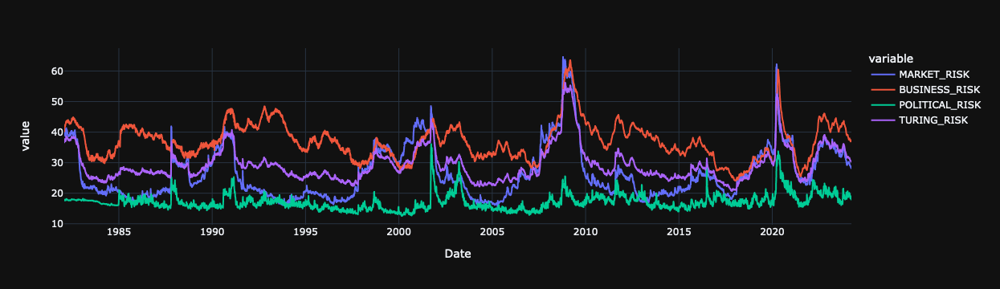

In [5]:
df_risks[["MARKET_RISK","BUSINESS_RISK","POLITICAL_RISK","TURING_RISK"]].tail(15400).plot()

**Business Risks**

In [6]:
df_business = sov.data("risks/business"); df_business.tail()

,ADS_BUSINESS_NEG,CREDIT_SPREAD,TERM_SPREAD,NEWS_SENT_NEG,CORP_BOND_DISTRESS,NAIIM_NEG,AAII_NEG,ATLANTA_UNC,CFSEC_NEG,CFNAI_FNEG,BUILDING_INDEX_NEG,CONSUMER_INDEX_NEG,INDUSTRY_INDEX_NEG,MAIN_INDEX_NEG,RETAIL_INDEX_NEG,SERVICES_INDEX_NEG,MAN_PHIL_NEG,MICS_ICS_NEG,MICS_ICC_NEG,MICS_ICE_NEG,NEW_TRUCKS,NEW_HOMES,MISERY_INDEX,HOUSING_AFFORD_NEG,NONMAN_OUTLOOK_NEG,MAN_NY_NEG,MAN_TEX_NEG,ZEW_SENT_NEG,ZEW_ACTUAL_NEG,BUSINESS_RISK
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2024-03-24,28.481,11.870,28.642,32.678,21.489,18.943,35.475,26.535,40.310,29.068,26.960,40.033,37.618,29.713,26.282,27.815,41.196,47.088,54.929,39.293,61.281,48.224,22.163,77.305,38.217,43.923,41.060,30.045,77.550,37.386
2024-03-25,28.481,11.937,29.008,32.678,21.491,18.943,35.476,26.535,40.310,29.068,26.960,40.031,37.618,29.714,26.282,27.815,41.196,47.088,54.930,39.293,61.280,48.224,22.160,77.306,38.217,43.922,41.060,30.044,77.551,37.401
2024-03-26,28.481,12.096,28.551,32.678,21.492,18.943,35.476,26.534,40.310,29.068,26.961,40.029,37.618,29.714,26.282,27.814,41.195,47.088,54.930,39.292,61.280,48.224,22.157,77.307,38.218,43.921,41.060,30.043,77.551,37.390
2024-03-27,28.481,12.096,28.550,32.678,21.493,18.943,35.476,26.534,40.310,29.067,26.962,40.028,37.617,29.714,26.282,27.814,41.195,47.087,54.930,39.291,61.279,48.224,22.154,77.307,38.218,43.921,41.060,30.042,77.552,37.390
2024-03-28,28.481,12.096,28.549,32.678,21.494,18.943,35.476,26.534,40.310,29.067,26.963,40.026,37.617,29.715,26.282,27.813,41.195,47.087,54.930,39.291,61.278,48.224,22.151,77.308,38.218,43.920,41.060,30.041,77.552,37.390


**Political Risks**

In [7]:
df_political = sov.data("risks/politics"); df_political.tail()

,US_POLICY_UNC_D,UK_POLICY_UNC_D,CHINA_POLICY_UNC_M,US_MARKET_UNC_D,US_POLICY_VOL_M,GLOBAL_POLICY_UNC_M,US_SOVEREIGN_UNC_M,GEO_UNC_D,GEO_UNC_M,GEO_EQUAL_M,WEB_SEARCH_UNC_M,THINKTANK_UNC_M,POLITICAL_RISK
Date,,,,,,,,,,,,,
2024-03-24,15.453,12.118,28.739,9.827,19.607,49.504,21.990,14.395,21.356,29.845,48.192,20.899,18.210
2024-03-25,14.137,13.388,28.739,9.372,19.607,49.504,21.989,22.014,21.356,29.845,48.192,20.899,18.229
2024-03-26,12.357,12.887,28.739,9.488,19.607,49.504,21.989,22.014,21.356,29.844,48.192,20.899,18.071
2024-03-27,11.818,15.840,28.739,9.488,19.607,49.504,21.989,22.014,21.356,29.844,48.192,20.899,18.056
2024-03-28,11.818,15.840,28.739,9.488,19.607,49.504,21.989,22.014,21.356,29.844,48.192,20.899,17.886


**Market Risks**

In [8]:
df_market = sov.data("risks/market"); df_market.tail()

,VIX,HS,MA,EWMA,GARCH,ENSEMBLE,RECESSION_6,RECESSION_12,RECESSION_24,TURBULENCE,SYSTEMIC,CAPE,MARKET_RISK
Date,,,,,,,,,,,,,
2024-03-24,14.572,21.056,22.079,21.796,11.908,17.594,26.166,52.160,71.320,10.326,28.453,43.247,28.390
2024-03-25,14.572,21.056,22.075,21.791,12.365,17.810,26.166,52.160,71.321,10.290,28.386,43.246,28.436
2024-03-26,14.572,21.055,22.023,21.734,11.615,17.243,26.167,52.161,71.321,10.196,28.251,43.244,28.298
2024-03-27,14.572,21.054,22.027,21.739,11.162,16.530,26.167,52.161,71.322,10.144,28.184,43.243,28.192
2024-03-28,14.572,21.053,22.025,21.734,10.736,16.324,26.168,52.162,71.322,10.144,28.185,43.241,28.139


**Computations**

In [10]:
df_risks_agg = sov.compute('risk-aggregates', df=df_risks); df_risks_agg.tail()

,TURING_RISK,MARKET_RISK,BUSINESS_RISK,POLITICAL_RISK,VOLATILITY_RISK,RECESSION_PROBABILITY,GEOPOLITICAL_RISK,DOMESTIC_POLITICAL_RISK,BOND_RISK,ECONOMIC_SENTIMENT,INVESTOR_SENTIMENT,CONSUMER_SENTIMENT,MANUFACTURING_SENTIMENT,SERVICES_SENTIMENT
Date,,,,,,,,,,,,,,
2024-03-24,30.461,28.390,37.386,18.210,16.083,49.882,25.265,23.014,20.667,41.769,28.154,48.156,42.060,30.772
2024-03-25,30.491,28.436,37.401,18.229,16.191,49.882,26.535,22.659,20.812,41.768,28.154,48.155,42.059,30.771
2024-03-26,30.401,28.298,37.390,18.071,15.908,49.883,26.463,22.327,20.713,41.768,28.154,48.155,42.059,30.771
2024-03-27,30.351,28.192,37.390,18.056,15.551,49.883,26.885,22.219,20.713,41.767,28.154,48.154,42.059,30.771
2024-03-28,30.301,28.139,37.390,17.886,15.448,49.884,26.885,22.219,20.713,41.767,28.153,48.153,42.058,30.771


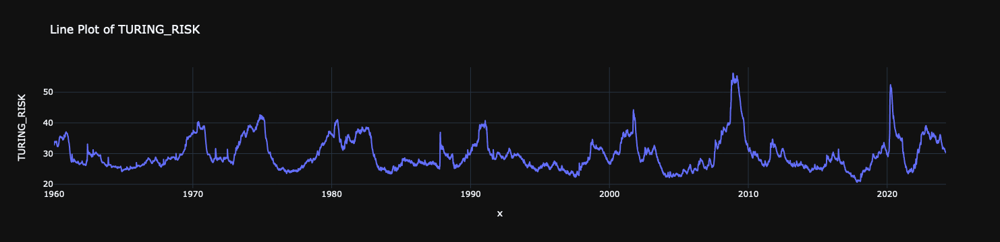

In [12]:
df_risks.plot_line()